In [1]:
import os
import re
import math
import tifffile
import cv2
import sys 
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
from scipy.stats import scoreatpercentile
from apeer_ometiff_library import io
from pathlib import Path

sys.path.append("..")
import src.ImageParser as IP


In [2]:
# path_images_raw = './data/IMC_ESD/2.ROIs_raw/'
path_images_raw = '../data/IMC_ESD/raw'
fovs = os.listdir(path_images_raw)
print(fovs)

['ESD4_02', 'ESD4_03', 'ESD1_05', 'ESD2_05', 'ESD8_05', 'ESD7_03', 'ESD7_08', 'ESD1_02', 'ESD7_04', 'ESD6_03', 'ESD4_05', 'ESD7_07', 'ESD2_03', 'ESD3_08', 'ESD3_06', 'ESD3_07', 'ESD8_04', 'ESD7_06', 'ESD1_03', 'ESD5_05', 'ESD8_03', 'ESD5_03', 'ESD6_07', 'ESD4_01', 'ESD2_02', 'ESD6_04', 'ESD6_02', 'ESD5_02', 'ESD3_03', 'ESD2_06', 'ESD2_01', 'ESD4_04', 'ESD8_09', 'ESD1_04', 'ESD7_09', 'ESD3_05', 'ESD1_08', 'ESD3_01', 'ESD8_01', 'ESD7_05', 'ESD8_07', 'ESD6_08', 'ESD8_08', 'ESD5_01', 'ESD5_04', 'ESD3_02', 'ESD3_04', 'ESD6_09', 'ESD5_06', 'ESD6_06', 'ESD7_01', 'ESD6_05', 'ESD8_06', 'ESD2_04', 'ESD1_09', 'ESD7_02', 'ESD1_01', 'ESD8_02', 'ESD6_01', 'ESD1_06', 'ESD1_07']


In [3]:
channels = ['CD20', 'Vimentin', 'PD-L1', 'CD31', 'CD163', 'VISTA', 'Ki-67', 'DNA2', 'IDO',
            'FOXP3', 'CD68', 'CD57', 'CD14', 'D2-40', 'CD56', 'CD45RO', 'DNA1', 'CD11c', 'CD7',
            'HLA-DR', 'CD204', 'CD8a', 'P16Ink4a', 'CD3', 'Granzyme B', 'Bcatenin',
            'Caspase', 'CD4', 'CD103', 'TGFbeta', 'PD-1', 'CD45', 'LAG-3', 
            'ICOS', 'CD11b', 'Keratin', 'TCRgd', 'CD15', 'TIM-3', 'CD38', 'Tbet', 'CD39']
channel_to_index = {name: index for index, name in enumerate(channels)}


def get_files_from_dir(fov):
    fov_folder = os.path.join(path_images_raw, fov)
    fov_files = os.listdir(fov_folder)
    fov_files = [filename for filename in fov_files if filename.lower().endswith((".tiff", ".tif"))]
    fov_files = [os.path.join(fov_folder, file) for file in fov_files]
    return fov_files

def get_stack(fov_files):
    # get a stack of images
    stack = []
    for channel in channels:   
        file = [filename for filename in fov_files if channel in filename][0]
        img_apeer, _ = io.read_ometiff(file)
        img = img_apeer.squeeze()
        stack.append(np.array(img))
    stack = np.stack(stack, axis = -1)
    return stack

def plot_comparison(image1, image2, channel_to_compare):

    plt.figure(figsize=(10, 5), dpi = 500)
    plt.subplot(1, 2, 1)
    plt.imshow(image1, cmap='gray') #,vmin = 0, vmax = 1
    plt.title(channel_to_compare)

    plt.subplot(1, 2, 2)
    plt.imshow(image2, cmap = 'gray') # , vmin = 0, vmax = 1
    plt.title(channel_to_compare)

    plt.show()

def save_stack(img, output_dir):
    if not os.path.exists(output_dir): 
        os.makedirs(output_dir) 
    for i in range(img.shape[2]):
        slice = img[:,:,i]
        channel = channels[i]
        filename = os.path.join(output_dir, f"{channel}.tiff") # .png

        # Save the image
        tifffile.imwrite(filename,np.float32(slice),
                 photometric="minisblack")


#         plt.imshow(np.float32(slice), cmap='gray')  # Assuming grayscale image, adjust cmap if needed
#         plt.axis('off')  # Turn off axes
    
#         # Save the image as a PNG file
#         plt.savefig(os.path.join(output_dir, f"{channel}.png"), bbox_inches='tight', pad_inches=0,dpi = 700)
#         plt.close()
        
        
# functions for neigbooring and counting pixels analysis
def get_counts_neigh(image):
    # Threshold the image to get binary values
    binary_image = (image > 0).astype(np.uint8)
    positive_pixel_count = np.count_nonzero(binary_image)
#     print(positive_pixel_count)
    # Find the coordinates of positive (non-zero) pixels in the binary image
    positive_pixel_coords = np.argwhere(binary_image == 1)

    # Initialize lists to store results
    positive_counts = []
    medians = []
    percentile_25 = []
    percentile_75 = []
    # Iterate through positive pixels
    for coord in positive_pixel_coords:
        y, x = coord[0], coord[1]
        
        # Extract the 3x3 window around the current positive pixel
        # Define the coordinates for the 3x3 window
        y_start, y_end = max(y - 1, 0), min(y + 2, binary_image.shape[0])
        x_start, x_end = max(x - 1, 0), min(x + 2, binary_image.shape[1])

        # Extract the 3x3 window around the current positive pixel
        window = binary_image[y_start:y_end, x_start:x_end]
            
        # Count positive pixels in the 3x3 window
        positive_count = np.count_nonzero(window)
        positive_counts.append(positive_count)

        # Calculate the median and percentiles
        
        window = image[y_start:y_end, x_start:x_end]
        median = np.median(window)
        p_25 = scoreatpercentile(window, 25)
        p_75 = scoreatpercentile(window, 75)

        # Append the statistics to the respective lists
        medians.append(median)
        percentile_25.append(p_25)
        percentile_75.append(p_75)
    return positive_counts, medians, percentile_25, percentile_75


def plot_hist_positive_neig(positive_counts1,positive_counts2):
    # Create a figure with two subplots (side by side)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Plot the first histogram on the left subplot
    axes[0].hist(positive_counts1, bins=range(max(positive_counts1) + 2), rwidth=0.8, align='left')
    axes[0].set_xlabel('Number of neighboring Positive Pixels of positive pixels')
    axes[0].set_ylabel('Frequency')
    axes[0].set_title('Histogram 1')

    # Plot the second histogram on the right subplot
    axes[1].hist(positive_counts2, bins=range(max(positive_counts2) + 2), rwidth=0.8, align='left')
    axes[1].set_xlabel('Number of neighboring Positive Pixels of positive pixels')
    axes[1].set_ylabel('Frequency')
    axes[1].set_title('Histogram 2')

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plots
    plt.show()

def plot_percentiles(list1,list2):
    # Create two separate figures for the first and second graphs
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # Plot the distribution of medians and percentiles for the first graph
    ax1.hist(list1, bins=10, color=['blue', 'green', 'red'], alpha=0.7, label=['Median', 'Percentile 25', 'Percentile 75'])
    ax1.set_xlabel('Values')
    ax1.set_ylabel('Frequency')
    ax1.set_title('Distribution of Medians and Percentiles ()')
    ax1.legend()
    # Plot the distribution of medians and percentiles for the first graph
    ax2.hist(list2, bins=10, color=['blue', 'green', 'red'], alpha=0.7, label=['Median', 'Percentile 25', 'Percentile 75'])
    ax2.set_xlabel('Values')
    ax2.set_ylabel('Frequency')
    ax2.set_title('Distribution of Medians and Percentiles ()')
    ax1.legend()

    # Adjust spacing between subplots
    plt.tight_layout()

    # Show the plots
    plt.show()
    

In [80]:
fov = 'ESD1_01/'
fov_files = get_files_from_dir(fov)
stack = get_stack(fov_files)
print(stack.shape)

# apply percentile
img_out = IP.remove_outliers(stack, up_limit=99, down_limit=1)
# normalize
img_norm = IP.normalize_by_channel(img_out)
print(np.max(img_norm))
print(np.min(img_norm))

(1000, 1000, 42)
1.0
0.0


# Bodenmiller filter

https://github.com/BodenmillerGroup/ImcSegmentationPipeline/blob/56ce18cfa570770eba169c7a3fb02ac492cc6d4b/src/imcsegpipe/utils.py#L10


In [8]:
def filter_hot_pixelsBodenmiller(img: np.ndarray, thres: float) -> np.ndarray:
    '''

    :param img:
    :param thres:
    :return:
    # https://github.com/BodenmillerGroup/ImcSegmentationPipeline/blob/56ce18cfa570770eba169c7a3fb02ac492cc6d4b/src/imcsegpipe/utils.py#L10

    '''
    from scipy.ndimage import maximum_filter
    kernel = np.ones((1, 3, 3), dtype=bool)
    kernel[0, 1, 1] = False
    # array([[[ True,  True,  True],
    #         [ True, False,  True],
    #         [ True,  True,  True]]])
    max_neighbor_img = maximum_filter(img, footprint=kernel, mode="mirror")
    return np.where(img - max_neighbor_img > thres, max_neighbor_img, img)


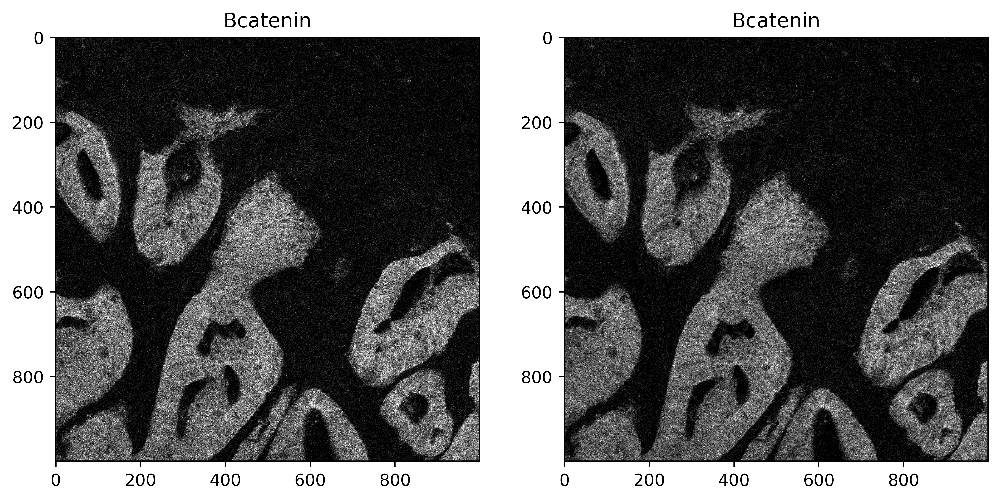

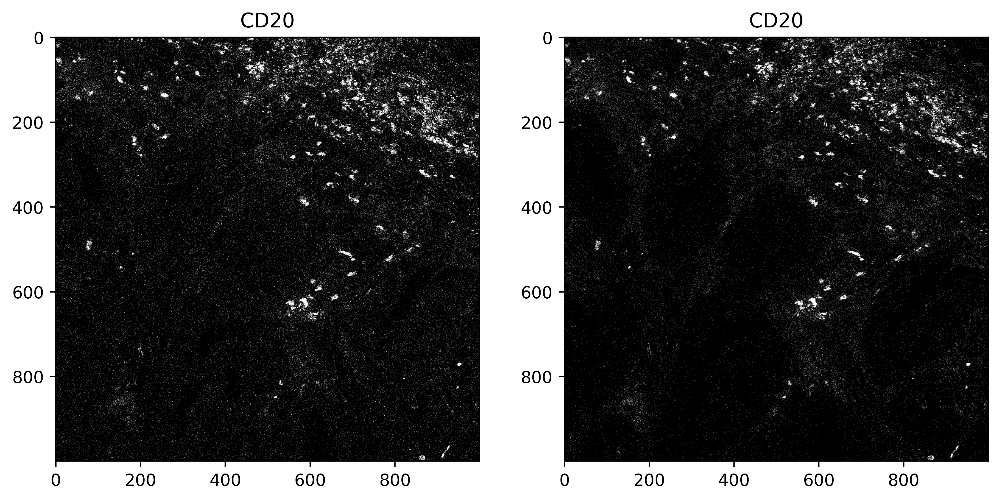

In [69]:
img_fil = filter_hot_pixelsBodenmiller(img_norm, thres = 0.05)
channel_to_compare = 'Bcatenin'
index = channel_to_index.get(channel_to_compare, -1)

plot_comparison(stack[:,:,index], img_fil[:,:,index], channel_to_compare)



channel_to_compare = 'CD20'
index = channel_to_index.get(channel_to_compare, -1)

plot_comparison(stack[:,:,index], img_fil[:,:,index], channel_to_compare)

In [67]:
output_dir='img_results/IMC_specific/Bodennorm05_'
save_stack(img_fil, output_dir)

# IMC denoise

# We will try the IMC denoise package from *
We will follow the instructions provided by theauthors in the Jupyter notebook.
https://github.com/PENGLU-WashU/IMC_Denoise/blob/main/Jupyter_Notebook_examples/IMC_Denoise_Train_and_Predict.ipynb
*Lu, Peng, et al. "IMC-Denoise: a content aware denoising pipeline to enhance Imaging Mass Cytometry." Nature communications 14.1 (2023): 1601.

In [5]:
# %load_ext autoreload
# %autoreload
from IMC_Denoise_package.IMC_Denoise.IMC_Denoise_main.DIMR import DIMR
from IMC_Denoise_package.IMC_Denoise.IMC_Denoise_main.DeepSNiF import DeepSNiF
from IMC_Denoise_package.IMC_Denoise.DeepSNiF_utils.DeepSNiF_DataGenerator import DeepSNiF_DataGenerator

# CD20

In [7]:
channel_name = "142Nd_CD20"
Raw_directory = "../data/IMC_ESD/raw" 

n_neighbours = 4 # Larger n enables removing more consecutive hot pixels. 
n_iter = 3 # Iteration number for DIMR
window_size = 3 # Slide window size. For IMC images, window_size = 3 is fine.

DataGenerator = DeepSNiF_DataGenerator(channel_name = channel_name, n_neighbours = n_neighbours, n_iter = n_iter, window_size = window_size)
generated_patches = DataGenerator.generate_patches_from_directory(load_directory = Raw_directory)
print('The shape of the generated training set is ' + str(generated_patches.shape) + '.')

Image data loaded from ...

../data/IMC_ESD/raw/ESD4_02/ESD4_02_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD4_03/ESD4_03_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD1_05/ESD1_05_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD2_05/ESD2_05_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD8_05/ESD8_05_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD7_03/ESD7_03_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD7_08/ESD7_08_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD1_02/ESD1_02_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD7_04/ESD7_04_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD6_03/ESD6_03_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD4_05/ESD4_05_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD7_07/ESD7_07_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD2_03/ESD2_03_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD3_08/ESD3_08_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD3_06/ESD3_06_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD3_07/ESD3_07_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/ESD8_04/ESD8_04_142Nd_CD20.ome.tiff
../data/IMC_ESD/raw/

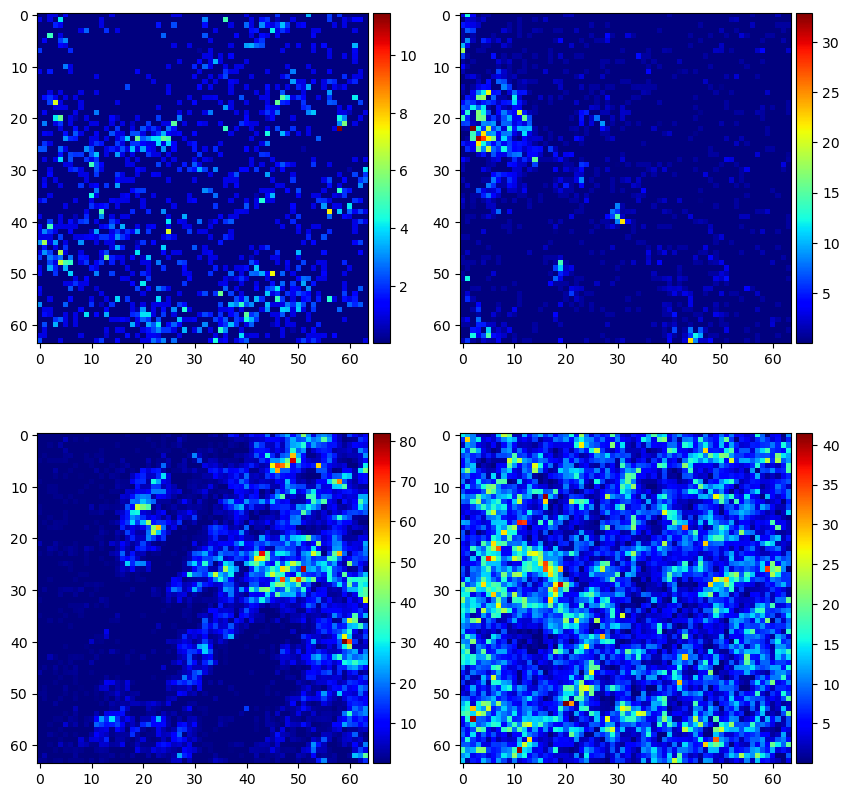

In [83]:
# Show several generated patches of the training set
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig = plt.figure(figsize=(10, 10))

ax1 = fig.add_subplot(221)
im1 = ax1.imshow(generated_patches[0,:,:], cmap = 'jet')
divider = make_axes_locatable(ax1)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im1, cax=cax, orientation='vertical')

ax2 = fig.add_subplot(222)
im2 = ax2.imshow(generated_patches[100,:,:], cmap = 'jet')
divider = make_axes_locatable(ax2)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im2, cax=cax, orientation='vertical')

ax3 = fig.add_subplot(223)
im3 = ax3.imshow(generated_patches[1000,:,:], cmap = 'jet')
divider = make_axes_locatable(ax3)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im3, cax=cax, orientation='vertical')

ax4 = fig.add_subplot(224)
im4 = ax4.imshow(generated_patches[-1,:,:], cmap = 'jet')
divider = make_axes_locatable(ax4)
cax = divider.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im4, cax=cax, orientation='vertical')

DeepSNiF configuration and training
Define parameters for DeepSNiF training.

In [85]:
train_epoches = 200 #50 # training epoches, which should be about 200 for a good training result. The default is 200.
train_initial_lr = 1e-3 # inital learning rate. The default is 1e-3.
train_batch_size = 128 # training batch size. For a GPU with smaller memory, it can be tuned smaller. The default is 256.
pixel_mask_percent = 0.2 # percentage of the masked pixels in each patch. The default is 0.2.
val_set_percent = 0.15 # percentage of validation set. The default is 0.15.
loss_function = "I_divergence" # loss function used. The default is "I_divergence".
weights_name = None # trained network weights saved here. If None, the weights will not be saved.
loss_name = None # training and validation losses saved here, either .mat or .npz format. If not defined, the losses will not be saved.
weights_save_directory = None # location where 'weights_name' and 'loss_name' saved.
# If the value is None, the files will be saved in a sub-directory named "trained_weights" of  the current file folder.
is_load_weights = False # Use the trained model directly. Will not read from saved one.
lambda_HF = 3e-6 # HF regularization parameter
deepsnif = DeepSNiF(train_epoches = train_epoches, 
                  train_learning_rate = train_initial_lr,
                  train_batch_size = train_batch_size,
                  mask_perc_pix = pixel_mask_percent,
                  val_perc = val_set_percent,
                  loss_func = loss_function,
                  weights_name = weights_name,
                  loss_name = loss_name,
                  weights_dir = weights_save_directory, 
                  is_load_weights = is_load_weights,
                  lambda_HF = lambda_HF)

start training

In [87]:
%%time

train_loss, val_loss = deepsnif.train(generated_patches)

The range value to the corresponding model is 124.0065872192383.
Input Channel Shape => (6656, 64, 64, 1)
Number of Training Examples: 5657
Number of Validation Examples: 999
Each training patch with shape of (64, 64) will mask 8 pixels.
Training model...
Epoch 1/200
45/45 [==============================] - 11s 223ms/step - loss: 0.3964 - val_loss: 0.5164
Epoch 2/200
45/45 [==============================] - 10s 217ms/step - loss: 0.1138 - val_loss: 0.1326
Epoch 3/200
45/45 [==============================] - 10s 218ms/step - loss: 0.0447 - val_loss: 0.0406
Epoch 4/200
45/45 [==============================] - 10s 219ms/step - loss: 0.0234 - val_loss: 0.0241
Epoch 5/200
45/45 [==============================] - 10s 221ms/step - loss: 0.0152 - val_loss: 0.0184
Epoch 6/200
45/45 [==============================] - 10s 222ms/step - loss: 0.0118 - val_loss: 0.0155
Epoch 7/200
45/45 [==============================] - 10s 222ms/step - loss: 0.0091 - val_loss: 0.0140
Epoch 8/200
45/45 [===========

45/45 [==============================] - 10s 222ms/step - loss: 0.0055 - val_loss: 0.0055
Epoch 151/200
45/45 [==============================] - 10s 222ms/step - loss: 0.0055 - val_loss: 0.0055
Epoch 152/200
45/45 [==============================] - 10s 222ms/step - loss: 0.0055 - val_loss: 0.0055
Epoch 153/200
45/45 [==============================] - 10s 222ms/step - loss: 0.0057 - val_loss: 0.0055
Epoch 154/200
45/45 [==============================] - 10s 222ms/step - loss: 0.0056 - val_loss: 0.0055
Epoch 155/200
45/45 [==============================] - 10s 222ms/step - loss: 0.0055 - val_loss: 0.0055
Epoch 156/200
45/45 [==============================] - 10s 223ms/step - loss: 0.0055 - val_loss: 0.0055
Epoch 157/200
45/45 [==============================] - 10s 222ms/step - loss: 0.0056 - val_loss: 0.0055
Epoch 158/200
45/45 [==============================] - 10s 222ms/step - loss: 0.0057 - val_loss: 0.0055
Epoch 159/200
45/45 [==============================] - 10s 222ms/step - loss: 

Plot the training and validation losses

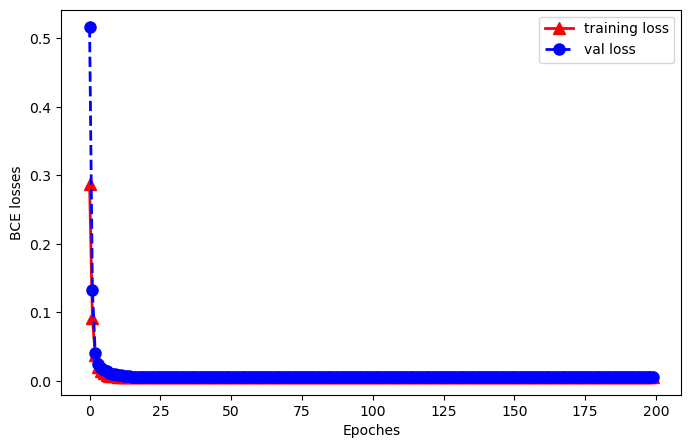

In [88]:
plt.figure(figsize=(8, 5))
plt.plot(np.array(range(len(train_loss))),train_loss, color='red', marker='^', linewidth=2, markersize=8)
plt.plot(np.array(range(len(val_loss))),val_loss, color='blue', marker='o', linestyle='dashed', linewidth=2, markersize=8)
plt.xlabel('Epoches')
plt.ylabel('BCE losses')
plt.legend(['training loss', 'val loss'])
plt.show()

Load a raw CD20 image

In [89]:
fov = 'ESD1_01/'
fov_files = get_files_from_dir(fov)
stack = get_stack(fov_files)
channel_to_compare = 'CD20'
index = channel_to_index.get(channel_to_compare, -1)

Img_raw = stack[:,:,index]


Perform the DIMR algorithm only if the SNR of the raw image is high.

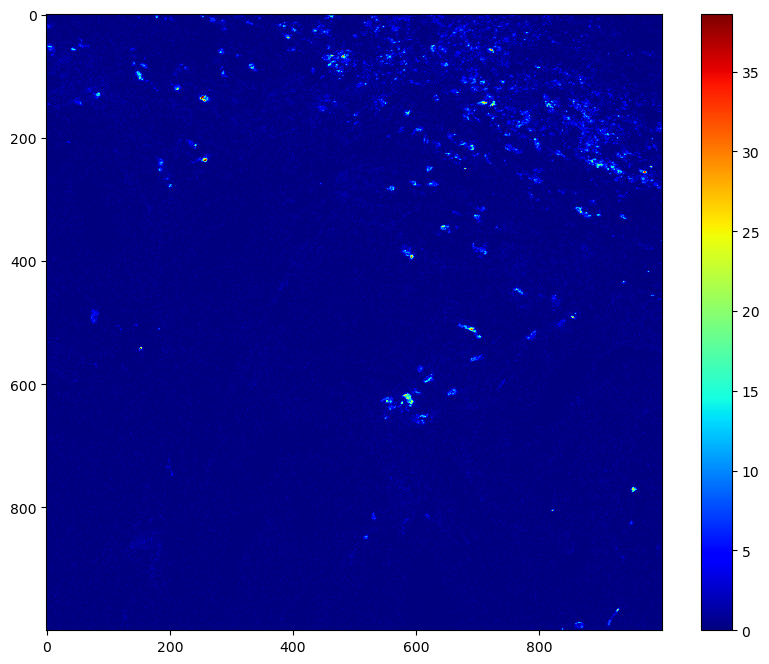

In [90]:
Img_DIMR = DIMR(n_neighbours = n_neighbours, n_iter = n_iter, window_size = window_size).perform_DIMR(Img_raw)
plt.figure(figsize = (10,8))
plt.imshow(Img_DIMR, vmin = 0, vmax = 0.5*np.max(Img_DIMR), cmap = 'jet')
plt.colorbar()
plt.show()

If the SNR of the raw image is sub-optimal, perform DIMR and DeepSNiF algorithms for low SNR raw images.

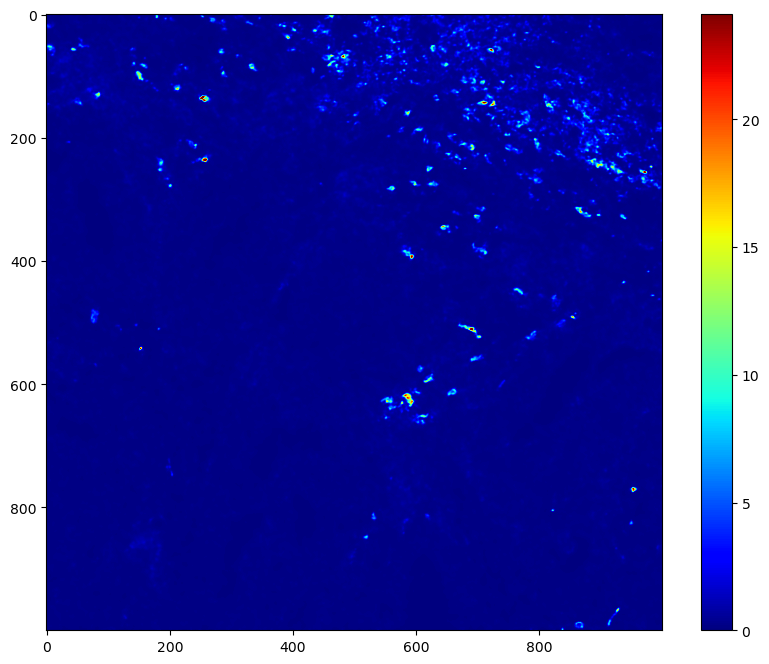

In [91]:
# perform DIMR and DeepSNiF algorithms for low SNR raw images.
Img_DIMR_DeepSNiF = deepsnif.perform_IMC_Denoise(Img_raw, n_neighbours = n_neighbours, n_iter = n_iter, window_size = window_size)
plt.figure(figsize = (10,8))
plt.imshow(Img_DIMR_DeepSNiF, vmin = 0, vmax = 0.5*np.max(Img_DIMR_DeepSNiF), cmap = 'jet')
plt.colorbar()
plt.show()

In [6]:
def plot_comparison_IMCDenoise(image1, image2,image3, channel_to_compare):

    fig, axs = plt.subplots(1, 3, figsize=(12, 4))

    # Plot the first image in the first subplot
    im1 = axs[0].imshow(image1, vmin=0, vmax=0.5 * np.max(image1), cmap='jet')
    axs[0].set_title(channel_to_compare + ' RAW')

    im2 = axs[1].imshow(image2, vmin=0, vmax=0.5 * np.max(image1), cmap='jet')
    axs[1].set_title(channel_to_compare + ' DIMR')

    im3 = axs[2].imshow(image3, vmin=0, vmax=0.5 * np.max(image1), cmap='jet')
    axs[2].set_title(channel_to_compare + ' DIMR and DeepSNIF')
    
    cbar1 = fig.colorbar(im1, ax=axs[0])
    cbar2 = fig.colorbar(im2, ax=axs[1])
    cbar3 = fig.colorbar(im3, ax=axs[2])

    plt.tight_layout()
    plt.show()

In [93]:

# for all CD20
channel_name = "142Nd_CD20"
Raw_directory = "../data/IMC_ESD/raw" 
dimr_dir = 'img_results/IMC_specific/DIMR_cd20_200ep'
deepsnif_dir = 'img_results/IMC_specific/DeppSNIF_cd20_200ep'
if not os.path.exists(dimr_dir): 
    os.makedirs(dimr_dir) 
if not os.path.exists(deepsnif_dir): 
    os.makedirs(deepsnif_dir) 

CD20_files = [file for file in Path(Raw_directory).rglob(f'*{channel_name}*')]
CD20_raw = []
CD20_DIMR = []
CD20_DeepSNIF = []
for file in CD20_files:
    filename = Path(file).name
    filename_dimr = os.path.join(dimr_dir, filename)
    filename_deepsnif = os.path.join(deepsnif_dir, filename)
    
    #read_img
    img_apeer, _ = io.read_ometiff(file)
    img = img_apeer.squeeze()
    CD20_raw.append(img)
    
    
    # perform DIMR with the model trained
    dmr = DIMR(n_neighbours = 4, n_iter = 3, window_size = 5)
    img_dimr = dmr.perform_DIMR(img)
    CD20_DIMR.append(img_dimr)
    
    tifffile.imwrite(filename_dimr,np.float32(img_dimr),photometric="minisblack")
    
    
    # DeepSNIF
    Img_DIMR_DeepSNiF = deepsnif.perform_IMC_Denoise(img, n_neighbours = n_neighbours, n_iter = n_iter, 
                                                     window_size = window_size)
    CD20_DeepSNIF.append(Img_DIMR_DeepSNiF)
    
    tifffile.imwrite(filename_deepsnif,np.float32(Img_DIMR_DeepSNiF),photometric="minisblack")


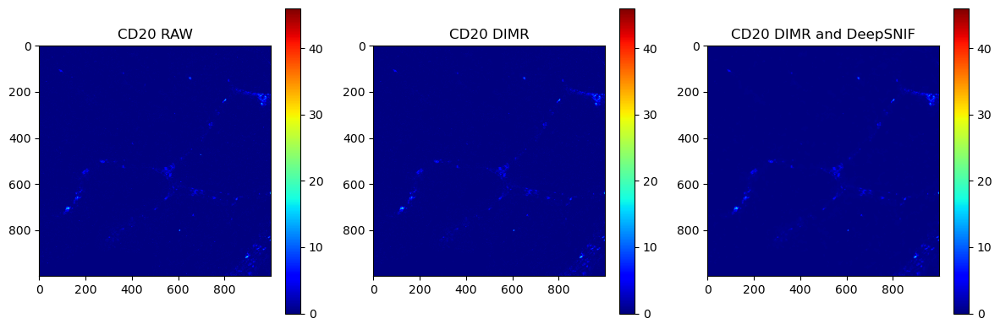

In [95]:
index = 10
index = 20
plot_comparison_IMCDenoise(CD20_raw[index], CD20_DIMR[index],CD20_DeepSNIF[index],channel_to_compare)


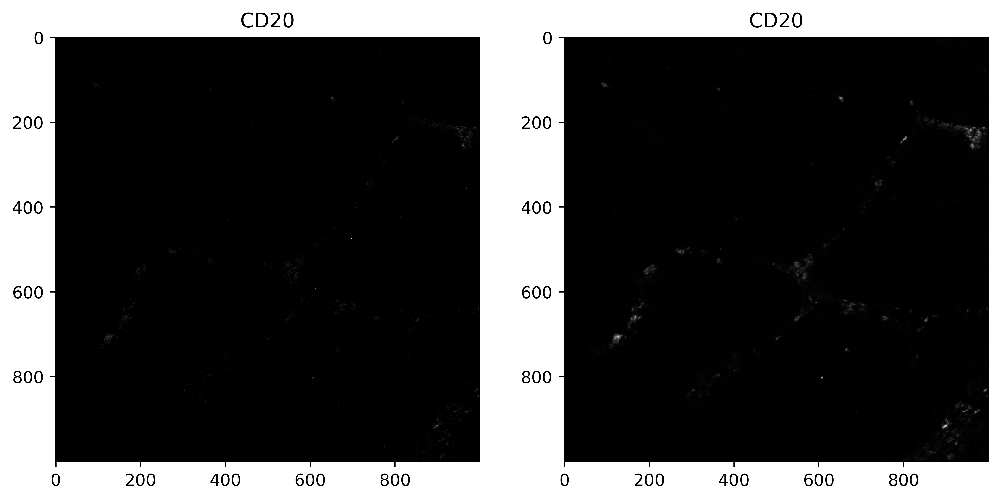

In [96]:
plot_comparison(CD20_raw[index],CD20_DeepSNIF[index],channel_to_compare)

Do all pipeline for other channel 

In [4]:
%%timeit
from IMC_Denoise_package.IMC_Denoise.IMC_Denoise_main.DIMR import DIMR
from IMC_Denoise_package.IMC_Denoise.IMC_Denoise_main.DeepSNiF import DeepSNiF
from IMC_Denoise_package.IMC_Denoise.DeepSNiF_utils.DeepSNiF_DataGenerator import DeepSNiF_DataGenerator


# the abve toook more than 17 hours. As the 200 epochs do not improve the loss comparing to 50. I wil run with 50
# # train DEEPSNIF
channel_name = "Bcatenin"
Raw_directory = "../data/IMC_ESD/raw" 

n_neighbours = 4 # Larger n enables removing more consecutive hot pixels. 
n_iter = 3 # Iteration number for DIMR
window_size = 3 # Slide window size. For IMC images, window_size = 3 is fine.

DataGenerator = DeepSNiF_DataGenerator(channel_name = channel_name, n_neighbours = n_neighbours, n_iter = n_iter, window_size = window_size)
generated_patches = DataGenerator.generate_patches_from_directory(load_directory = Raw_directory)
print('The shape of the generated training set is ' + str(generated_patches.shape) + '.')

train_epoches = 50 # training epoches, which should be about 200 for a good training result. The default is 200.
train_initial_lr = 1e-3 # inital learning rate. The default is 1e-3.
train_batch_size = 128 # training batch size. For a GPU with smaller memory, it can be tuned smaller. The default is 256.
pixel_mask_percent = 0.2 # percentage of the masked pixels in each patch. The default is 0.2.
val_set_percent = 0.15 # percentage of validation set. The default is 0.15.
loss_function = "I_divergence" # loss function used. The default is "I_divergence".
weights_name = None # trained network weights saved here. If None, the weights will not be saved.
loss_name = None # training and validation losses saved here, either .mat or .npz format. If not defined, the losses will not be saved.
weights_save_directory = None # location where 'weights_name' and 'loss_name' saved.
# If the value is None, the files will be saved in a sub-directory named "trained_weights" of  the current file folder.
is_load_weights = False # Use the trained model directly. Will not read from saved one.
lambda_HF = 3e-6 # HF regularization parameter
deepsnif = DeepSNiF(train_epoches = train_epoches, 
                  train_learning_rate = train_initial_lr,
                  train_batch_size = train_batch_size,
                  mask_perc_pix = pixel_mask_percent,
                  val_perc = val_set_percent,
                  loss_func = loss_function,
                  weights_name = weights_name,
                  loss_name = loss_name,
                  weights_dir = weights_save_directory, 
                  is_load_weights = is_load_weights,
                  lambda_HF = lambda_HF)
train_loss, val_loss = deepsnif.train(generated_patches)


dimr_dir = 'img_results/IMC_specific/DIMR_bcat_100ep'
deepsnif_dir = 'img_results/IMC_specific/DeepSNIF_bcat_100ep'
if not os.path.exists(dimr_dir): 
    os.makedirs(dimr_dir) 
if not os.path.exists(deepsnif_dir): 
    os.makedirs(deepsnif_dir) 



bcat_files = [file for file in Path(Raw_directory).rglob(f'*{channel_name}*')]
bcat_raw = []
bcat_DIMR = []
bcat_DeepSNIF = []
for file in bcat_files:
    filename = Path(file).name
    filename_dimr = os.path.join(dimr_dir, filename)
    filename_deepsnif = os.path.join(deepsnif_dir, filename)
    
    #read_img
    img_apeer, _ = io.read_ometiff(file)
    img = img_apeer.squeeze()
    bcat_raw.append(img)
    
    
    # perform DIMR with the model trained
    dmr = DIMR(n_neighbours = 4, n_iter = 3, window_size = 5)
    img_dimr = dmr.perform_DIMR(img)
    bcat_DIMR.append(img_dimr)
    
    tifffile.imwrite(filename_dimr,np.float32(img_dimr),photometric="minisblack")
    
    # DeepSNIF
    Img_DIMR_DeepSNiF = deepsnif.perform_IMC_Denoise(img, n_neighbours = n_neighbours, n_iter = n_iter, 
                                                     window_size = window_size)
    bcat_DeepSNIF.append(Img_DIMR_DeepSNiF)
    
    tifffile.imwrite(filename_deepsnif,np.float32(Img_DIMR_DeepSNiF),photometric="minisblack")

index = 10
plot_comparison_IMCDenoise(bcat_raw[index], bcat_DIMR[index],bcat_DeepSNIF[index],channel_to_compare = "Bcatenin")



2024-02-09 13:17:35.565690: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1
/home/martinha/miniconda3/envs/penguin_comparison/lib/python3.9/site-packages/tensorflow/python/framework/dtypes.py:513: FutureWarning: In the future `np.object` will be defined as the corresponding NumPy scalar.
  np.object,


AttributeError: module 'numpy' has no attribute 'object'.
`np.object` was a deprecated alias for the builtin `object`. To avoid this error in existing code, use `object` by itself. Doing this will not modify any behavior and is safe. 
The aliases was originally deprecated in NumPy 1.20; for more details and guidance see the original release note at:
    https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations

In [7]:
%%timeit
from IMC_Denoise_package.IMC_Denoise.IMC_Denoise_main.DIMR import DIMR
from IMC_Denoise_package.IMC_Denoise.IMC_Denoise_main.DeepSNiF import DeepSNiF
from IMC_Denoise_package.IMC_Denoise.DeepSNiF_utils.DeepSNiF_DataGenerator import DeepSNiF_DataGenerator


# the abve toook more than 17 hours. As the 200 epochs do not improve the loss comparing to 50. I wil run with 50
# # train DEEPSNIF
channel_name = "Bcatenin"
Raw_directory = "../data/IMC_ESD/raw" 

n_neighbours = 4 # Larger n enables removing more consecutive hot pixels. 
n_iter = 3 # Iteration number for DIMR
window_size = 3 # Slide window size. For IMC images, window_size = 3 is fine.

DataGenerator = DeepSNiF_DataGenerator(channel_name = channel_name, n_neighbours = n_neighbours, n_iter = n_iter, window_size = window_size)
generated_patches = DataGenerator.generate_patches_from_directory(load_directory = Raw_directory)
print('The shape of the generated training set is ' + str(generated_patches.shape) + '.')

train_epoches = 50 # training epoches, which should be about 200 for a good training result. The default is 200.
train_initial_lr = 1e-3 # inital learning rate. The default is 1e-3.
train_batch_size = 128 # training batch size. For a GPU with smaller memory, it can be tuned smaller. The default is 256.
pixel_mask_percent = 0.2 # percentage of the masked pixels in each patch. The default is 0.2.
val_set_percent = 0.15 # percentage of validation set. The default is 0.15.
loss_function = "I_divergence" # loss function used. The default is "I_divergence".
weights_name = None # trained network weights saved here. If None, the weights will not be saved.
loss_name = None # training and validation losses saved here, either .mat or .npz format. If not defined, the losses will not be saved.
weights_save_directory = None # location where 'weights_name' and 'loss_name' saved.
# If the value is None, the files will be saved in a sub-directory named "trained_weights" of  the current file folder.
is_load_weights = False # Use the trained model directly. Will not read from saved one.
lambda_HF = 3e-6 # HF regularization parameter
deepsnif = DeepSNiF(train_epoches = train_epoches, 
                  train_learning_rate = train_initial_lr,
                  train_batch_size = train_batch_size,
                  mask_perc_pix = pixel_mask_percent,
                  val_perc = val_set_percent,
                  loss_func = loss_function,
                  weights_name = weights_name,
                  loss_name = loss_name,
                  weights_dir = weights_save_directory, 
                  is_load_weights = is_load_weights,
                  lambda_HF = lambda_HF)
train_loss, val_loss = deepsnif.train(generated_patches)


dimr_dir = 'img_results/IMC_specific/DIMR_bcat_50ep'
deepsnif_dir = 'img_results/IMC_specific/DeepSNIF_bcat_50ep'
if not os.path.exists(dimr_dir): 
    os.makedirs(dimr_dir) 
if not os.path.exists(deepsnif_dir): 
    os.makedirs(deepsnif_dir) 



bcat_files = [file for file in Path(Raw_directory).rglob(f'*{channel_name}*')]
bcat_raw = []
bcat_DIMR = []
bcat_DeepSNIF = []
for file in bcat_files:
    filename = Path(file).name
    filename_dimr = os.path.join(dimr_dir, filename)
    filename_deepsnif = os.path.join(deepsnif_dir, filename)
    
    #read_img
    img_apeer, _ = io.read_ometiff(file)
    img = img_apeer.squeeze()
    bcat_raw.append(img)
    
    
    # perform DIMR with the model trained
    dmr = DIMR(n_neighbours = 4, n_iter = 3, window_size = 5)
    img_dimr = dmr.perform_DIMR(img)
    bcat_DIMR.append(img_dimr)
    
    tifffile.imwrite(filename_dimr,np.float32(img_dimr),photometric="minisblack")
    
    # DeepSNIF
    Img_DIMR_DeepSNiF = deepsnif.perform_IMC_Denoise(img, n_neighbours = n_neighbours, n_iter = n_iter, 
                                                     window_size = window_size)
    bcat_DeepSNIF.append(Img_DIMR_DeepSNiF)
    
    tifffile.imwrite(filename_deepsnif,np.float32(Img_DIMR_DeepSNiF),photometric="minisblack")

index = 10
plot_comparison_IMCDenoise(bcat_raw[index], bcat_DIMR[index],bcat_DeepSNIF[index],channel_to_compare = "Bcatenin")

Image data loaded from ...

../data/IMC_ESD/raw/ESD4_02/ESD4_02_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD4_03/ESD4_03_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD1_05/ESD1_05_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD2_05/ESD2_05_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD8_05/ESD8_05_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD7_03/ESD7_03_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD7_08/ESD7_08_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD1_02/ESD1_02_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD7_04/ESD7_04_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD6_03/ESD6_03_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD4_05/ESD4_05_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD7_07/ESD7_07_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD2_03/ESD2_03_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD3_08/ESD3_08_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD3_06/ESD3_06_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD3_07/ESD3_07_89Y_Bcatenin.ome.tiff
../data/IMC_ESD/raw/ESD8_04/ESD8_04_89Y_Bcat

2024-02-13 13:28:56.147507: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-13 13:28:56.147834: I tensorflow/compiler/jit/xla_gpu_device.cc:99] Not creating XLA devices, tf_xla_enable_xla_devices not set
2024-02-13 13:28:56.271153: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:941] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-02-13 13:28:56.271277: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1720] Found device 0 with properties: 
pciBusID: 0000:01:00.0 name: NVIDIA GeForce RTX 2080 Ti computeCapability: 7.5
coreClock: 1.545GHz coreCount: 68 deviceMemorySize: 10.75GiB deviceMemoryBandwidth: 573

The range value to the corresponding model is 33.40594139099122.
Input Channel Shape => (127176, 64, 64, 1)
Number of Training Examples: 108099
Number of Validation Examples: 19077
Each training patch with shape of (64, 64) will mask 8 pixels.
Training model...
Epoch 1/50


/home/martinha/miniconda3/envs/penguin_comparison/lib/python3.9/site-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
2024-02-13 13:29:23.458689: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2024-02-13 13:29:23.476829: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 3000000000 Hz
2024-02-13 13:29:24.953733: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.7
2024-02-13 13:29:25.541531: W tensorflow/stream_executor/gpu/asm_compiler.cc:63] Running ptxas --version returned 256
2024-02-13 13:29:25.570765: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] Internal: ptxas exited with non-zero error code 256, o

845/845 [==============================] - 273s 288ms/step - loss: 0.0904 - val_loss: 0.0201
Epoch 2/50
845/845 [==============================] - 189s 223ms/step - loss: 0.0202 - val_loss: 0.0202
Epoch 3/50
845/845 [==============================] - 189s 224ms/step - loss: 0.0202 - val_loss: 0.0201
Epoch 4/50
845/845 [==============================] - 189s 224ms/step - loss: 0.0201 - val_loss: 0.0200
Epoch 5/50
845/845 [==============================] - 189s 224ms/step - loss: 0.0201 - val_loss: 0.0201
Epoch 6/50
845/845 [==============================] - 189s 224ms/step - loss: 0.0201 - val_loss: 0.0201
Epoch 7/50
845/845 [==============================] - 189s 224ms/step - loss: 0.0201 - val_loss: 0.0202
Epoch 8/50
845/845 [==============================] - 189s 224ms/step - loss: 0.0201 - val_loss: 0.0200
Epoch 9/50
845/845 [==============================] - 189s 224ms/step - loss: 0.0201 - val_loss: 0.0202
Epoch 10/50
845/845 [==============================] - 189s 224ms/step - lo

NameError: name 'index' is not defined

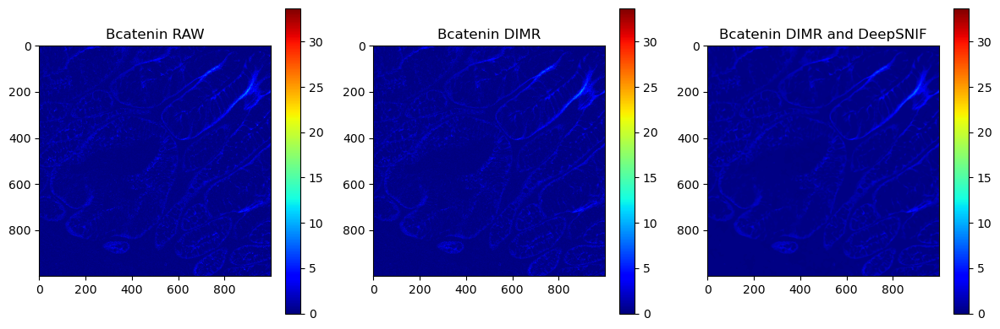

In [8]:
index = 10
channel_name = "Bcatenin"
Raw_directory = "../data/IMC_ESD/raw" 
dimr_dir = 'img_results/IMC_specific/DIMR_bcat_50ep/'
deepsnif_dir = 'img_results/IMC_specific/DeepSNIF_bcat_50ep/'

files = os.listdir(deepsnif_dir)
file = os.path.join(deepsnif_dir,files[index])
img_apeer, _ = io.read_ometiff(file)
file_deepsnif = img_apeer.squeeze()

files = os.listdir(dimr_dir)
file = os.path.join(dimr_dir,files[index])
img_apeer, _ = io.read_ometiff(file)
file_dimr = img_apeer.squeeze()

filename = files[index]  # ESD8_02_89Y_Bcatenin.ome.tiff
files = os.listdir(Raw_directory)
extracted_string = filename.split('_', 2)[0] + "_" + filename.split('_', 2)[1]
file = os.path.join(os.path.join(Raw_directory,extracted_string), filename)
img_apeer, _ = io.read_ometiff(file)
file_raw = img_apeer.squeeze()

plot_comparison_IMCDenoise(file_raw, file_dimr,file_deepsnif,channel_to_compare="Bcatenin")

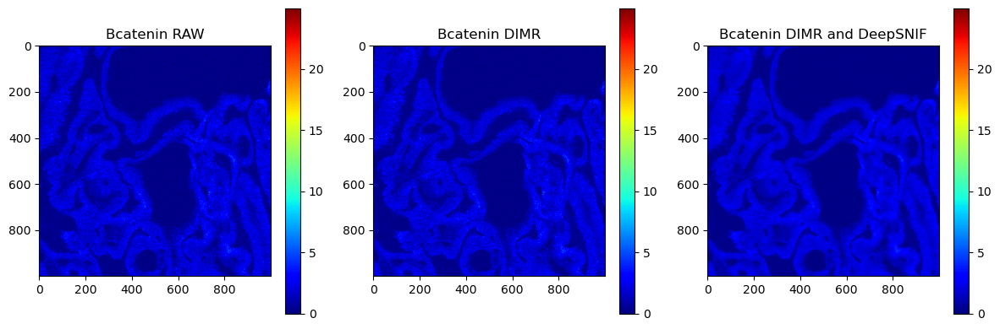

In [9]:
index = 18
channel_name = "Bcatenin"
Raw_directory = "../data/IMC_ESD/raw" 
dimr_dir = 'img_results/IMC_specific/DIMR_bcat_50ep/'
deepsnif_dir = 'img_results/IMC_specific/DeepSNIF_bcat_50ep/'

files = os.listdir(deepsnif_dir)
file = os.path.join(deepsnif_dir,files[index])
img_apeer, _ = io.read_ometiff(file)
file_deepsnif = img_apeer.squeeze()

files = os.listdir(dimr_dir)
file = os.path.join(dimr_dir,files[index])
img_apeer, _ = io.read_ometiff(file)
file_dimr = img_apeer.squeeze()

filename = files[index]  # ESD8_02_89Y_Bcatenin.ome.tiff
files = os.listdir(Raw_directory)
extracted_string = filename.split('_', 2)[0] + "_" + filename.split('_', 2)[1]
file = os.path.join(os.path.join(Raw_directory,extracted_string), filename)
img_apeer, _ = io.read_ometiff(file)
file_raw = img_apeer.squeeze()

plot_comparison_IMCDenoise(file_raw, file_dimr,file_deepsnif,channel_to_compare="Bcatenin")